In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import torch.nn as nn
import torch.optim as optim
import os

In [ ]:
import sys
sys.path.insert(1, './source/dcgan')

In [5]:
from source.dcgan.dcgan_model import Discriminator, Generator, DCGAN

## Load CelebA

In [8]:
# Batch size during training
BATCH_SIZE = 128

#Size of preprocessed image
PICTURE_SIZE = 64

# Size of z latent vector
Z_LATENT = 100

# Size of generator output (channels)
GENERATOR_PARAMETER = 64

#  Size of discriminator output (channels)
DISCRIMINATOR_PARAMETER = 64

# Number of epochs to train
NUM_EPOCHS = 25

# Learning rate for optimizers
lr = 0.0002

# Path for logs
LOG_PATH = './dcgan_train_process_2'


# Path for dataset
DATA_PATH = './data'


In [3]:
transform = transforms.Compose(
    [transforms.CenterCrop(178),
    transforms.Resize(PICTURE_SIZE),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CelebA(root=DATA_PATH, split='train',
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH_SIZE,
                                          shuffle=True)

testset = torchvision.datasets.CelebA(root=DATA_PATH, split='test',
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH_SIZE,
                                         shuffle=False)

Files already downloaded and verified
Files already downloaded and verified


In [10]:
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")

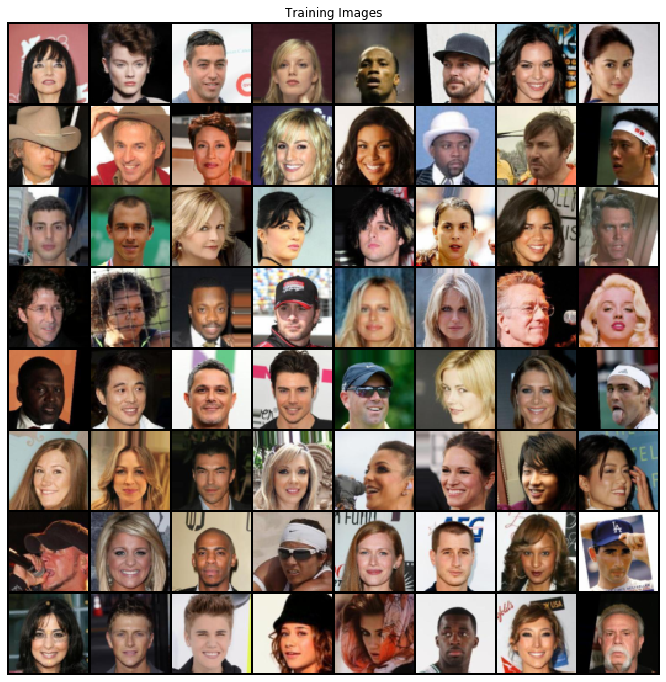

In [5]:
# Plot some training images
real_batch = next(iter(trainloader))
plt.figure(figsize=(12,12))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

## DCGAN model

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [11]:
model = DCGAN(GENERATOR_PARAMETER, DISCRIMINATOR_PARAMETER,Z_LATENT,device)

## Weight Initialization

In [27]:
model.G.apply(weights_init)
model.D.apply(weights_init)

Discriminator(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

## Load model

In [12]:
checkpoint = torch.load(os.path.join(LOG_PATH,'131000_generator.ckpt'))
model.G.load_state_dict(checkpoint)
checkpoint = torch.load(os.path.join(LOG_PATH,'131000_discriminator.ckpt'))
model.D.load_state_dict(checkpoint)

<All keys matched successfully>

## Evaluate model

In [17]:
z = torch.randn(64, Z_LATENT, 1, 1, device = device)

In [18]:
images = model.G(z)

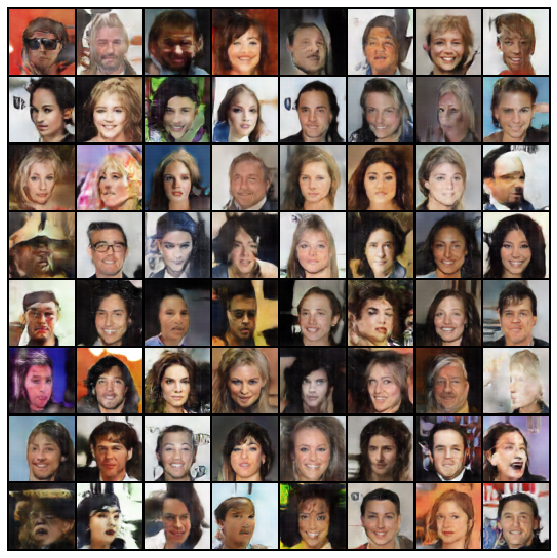

In [24]:
fig = plt.figure(figsize=(10,10))
plt.axis("off")
image = np.transpose(vutils.make_grid(images.cpu().detach(), padding=2, normalize=True).numpy(),(1,2,0))
plt.imshow(image)

## Plot Losses

In [15]:
log_discriminator = {}
logs = [f for f in os.listdir(LOG_PATH) if '.txt' in f]
logs_discr = [f for f in logs if 'discriminator' in f]
logs_gen = [f for f in logs if 'generator' in f]

for log in logs_discr:
    with open(os.path.join(LOG_PATH,log),'r') as f:
        for s in f:
            epoch, iter, loss=s.rstrip().split('\t')
            epoch = int(epoch)
            iter = int(iter)
            loss = float(loss)
            if epoch in log_discriminator.keys():
                log_discriminator[epoch].append(loss)
            else:
                log_discriminator[epoch] = []
losses_per_epoch_discriminator = []
for epoch in log_discriminator.keys():
    losses_per_epoch_discriminator.append(np.mean(log_discriminator[epoch]))
    
log_generator = {}

for log in logs_gen:
    with open(os.path.join(LOG_PATH,log),'r') as f:
        for s in f:
            epoch, iter, loss=s.rstrip().split('\t')
            epoch = int(epoch)
            iter = int(iter)
            loss = float(loss)
            if epoch in log_generator.keys():
                log_generator[epoch].append(loss)
            else:
                log_generator[epoch] = []
losses_per_epoch_generator = []
for epoch in log_generator.keys():
    losses_per_epoch_generator.append(np.mean(log_generator[epoch]))

## Training process animation

In [13]:
import os
import cv2

img_list = [cv2.cvtColor(cv2.imread(os.path.join(LOG_PATH,str(i*10)+'.png')), cv2.COLOR_BGR2RGB) for i in range(20,13100,1000)]

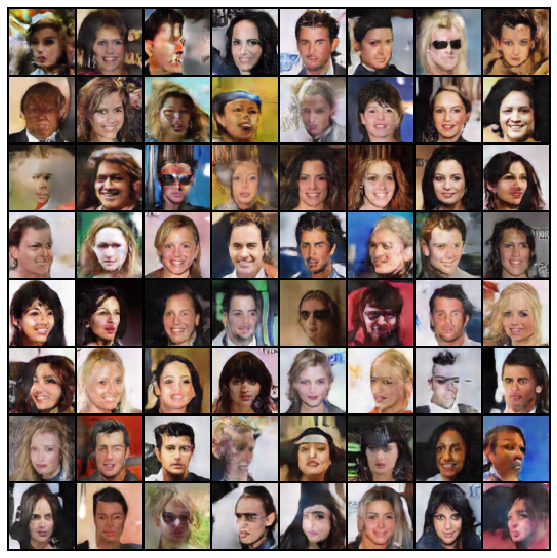

In [14]:
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
fig = plt.figure(figsize=(10,10))
plt.axis("off")


ims = [[plt.imshow(i, animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
ani.save('./dcgan.gif', writer='imagemagick', fps=5)

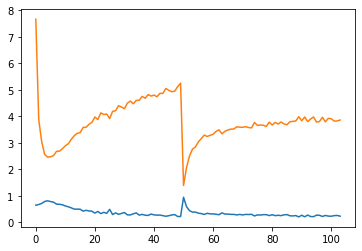

In [16]:
plt.plot(losses_per_epoch_discriminator)
plt.plot(losses_per_epoch_generator)